In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction import DictVectorizer
from sklearn.metrics import mutual_info_score
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import KFold

from IPython.display import display
from pandas_profiling import ProfileReport

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import average_precision_score

%matplotlib inline
pd.set_option('display.max_columns', None)
pd.options.display.max_rows = 40

##### **I. Reading the dataset**

In [2]:
df = pd.read_csv('C:/Machine Learning Training/Telco Churn Project/dataset/telco_customer_churn.csv')
df.head()

,Customer ID,Gender,Age,Married,Number of Dependents,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Satisfaction Score,Churn Value
0,8779-QRDMV,Male,61 and above,0,0,0,1,0,0,0.00,0,DSL,8,0,0,1,0,0,1,0,0,Month-to-Month,1,Bank Withdrawal,39.65,39.65,0.00,20,0.00,59.65,3,1
1,7495-OOKFY,Female,61 and above,1,1,1,8,1,1,48.85,1,Fiber Optic,17,0,1,0,0,0,0,0,1,Month-to-Month,1,Credit Card,80.65,633.30,0.00,0,390.80,1024.10,3,1
2,1658-BYGOY,Male,61 and above,0,3,0,18,1,1,11.33,1,Fiber Optic,52,0,0,0,0,1,1,1,1,Month-to-Month,1,Bank Withdrawal,95.45,1752.55,45.61,0,203.94,1910.88,2,1
3,4598-XLKNJ,Female,61 and above,1,1,1,25,1,1,19.76,0,Fiber Optic,12,0,1,1,0,1,1,0,1,Month-to-Month,1,Bank Withdrawal,98.50,2514.50,13.43,0,494.00,2995.07,2,1
4,4846-WHAFZ,Female,61 and above,1,1,1,37,1,1,6.33,1,Fiber Optic,14,0,0,0,0,0,0,0,1,Month-to-Month,1,Bank Withdrawal,76.50,2868.15,0.00,0,234.21,3102.36,2,1


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 32 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Gender                             7043 non-null   object 
 2   Age                                7043 non-null   object 
 3   Married                            7043 non-null   int64  
 4   Number of Dependents               7043 non-null   int64  
 5   Number of Referrals                7043 non-null   int64  
 6   Tenure in Months                   7043 non-null   int64  
 7   Offer                              7043 non-null   int64  
 8   Phone Service                      7043 non-null   int64  
 9   Avg Monthly Long Distance Charges  7043 non-null   float64
 10  Multiple Lines                     7043 non-null   int64  
 11  Internet Service                   7043 non-null   objec

##### **II. Data cleaning**

In [4]:
# Making the column names consistent
df.columns = df.columns.str.replace(' ', '_').str.lower()

# Deleting the customer_id column
del df['customer_id']

# We also clean the values of each categorical column
# making them lowercase and fixing the spaces 
strings = list(df.dtypes[df.dtypes == 'object'].index)

for col in strings:
    df[col] = df[col].str.lower().str.replace(' ','_')


##### **III. Exploratory Data Analysis**

In [5]:
profile = ProfileReport(df, title='Telco Churn Dataset', html={'style':{'full_width': True}}, dark_mode=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# Checking for multi-collinearity among numerical variables
numerical = ['number_of_dependents','number_of_referrals','tenure_in_months',
'avg_monthly_long_distance_charges','avg_monthly_gb_download','monthly_charge',
]

def calculate_vif(df, features):    
    vif, tolerance = {}, {}
    # all the features that you want to examine
    for feature in features:
        # extract all the other features you will regress against
        X = [f for f in features if f != feature]        
        X, y = df[X], df[feature]
        # extract r-squared from the fit
        r2 = LinearRegression().fit(X, y).score(X, y)                
        
        # calculate tolerance
        tolerance[feature] = 1 - r2
        # calculate VIF
        vif[feature] = 1/(tolerance[feature])
    # return VIF DataFrame
    return pd.DataFrame({'VIF': vif, 'Tolerance': tolerance,'R2':r2})

In [7]:
non_collinear_feats = calculate_vif(df=df, features=numerical)
non_collinear_feats

,VIF,Tolerance,R2
number_of_dependents,1.160246,0.861887,0.270784
number_of_referrals,1.200073,0.833283,0.270784
tenure_in_months,1.208998,0.827131,0.270784
avg_monthly_long_distance_charges,1.030383,0.970513,0.270784
avg_monthly_gb_download,1.251549,0.799010,0.270784
monthly_charge,1.371337,0.729216,0.270784


In [8]:
non_collinear_feats.index

Index(['number_of_dependents', 'number_of_referrals', 'tenure_in_months',
       'avg_monthly_long_distance_charges', 'avg_monthly_gb_download',
       'monthly_charge'],
      dtype='object')

In [9]:
from sklearn.feature_selection import SelectKBest

fs = SelectKBest(k='all')
fs.fit(df[non_collinear_feats.index], df.churn_value)

SelectKBest(k='all')

Feature number_of_dependents: 353.95796360178286
Feature number_of_referrals: 629.8157131699645
Feature tenure_in_months: 1001.3628274161512
Feature avg_monthly_long_distance_charges: 0.4642208509360131
Feature avg_monthly_gb_download: 16.85442224036058
Feature monthly_charge: 273.4637042077079


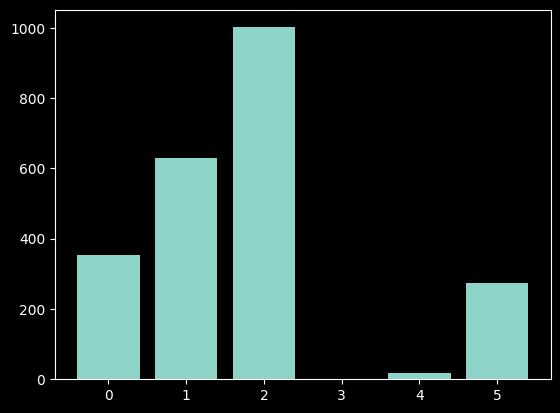

In [10]:
# what are scores for the features
for i in range(len(fs.scores_)):
	print(f'Feature {non_collinear_feats.index[i]}: {fs.scores_[i]}')
# plot the scores
plt.bar([i for i in range(len(fs.scores_))], fs.scores_)
plt.show()

In [11]:
# Inspecting the relationship between each categorical variable with target churn
categorical = ['gender', 'age', 'married', 'offer', 'phone_service','multiple_lines',
       'internet_service','online_security',
       'online_backup', 'device_protection_plan', 'premium_tech_support',
       'streaming_tv', 'streaming_movies', 'streaming_music', 'unlimited_data',
       'contract', 'paperless_billing', 'payment_method','satisfaction_score']

# Risk-ratio describes the ratio between the mean of each category and the global churn rate. 
# A risk-ratio greater than 1 means that that category is more likely to churn, and a risk-ratio of less than 1 is less likely to churn.
global_churn_rate = df.churn_value.mean()

for c in categorical:
    print(c)
    df_group = df.groupby(c).churn_value.agg(['mean','count'])
    df_group['diff'] = df_group['mean'] - global_churn_rate
    df_group['risk'] = df_group['mean'] / global_churn_rate
    display(df_group)
    print()

gender


,mean,count,diff,risk
gender,,,,
female,0.269209,3488,0.003839,1.014466
male,0.261603,3555,-0.003766,0.985807



age


,mean,count,diff,risk
age,,,,
30_and_below,0.223676,1529,-0.041694,0.842882
31_-_60,0.239097,3852,-0.026273,0.900994
61_and_above,0.364621,1662,0.099251,1.374010



married


,mean,count,diff,risk
married,,,,
0,0.329580,3641,0.064210,1.241964
1,0.196649,3402,-0.068721,0.741038



offer


,mean,count,diff,risk
offer,,,,
0,0.271086,3877,0.005716,1.021540
1,0.258370,3166,-0.007000,0.973623



phone_service


,mean,count,diff,risk
phone_service,,,,
0,0.249267,682,-0.016103,0.939319
1,0.267096,6361,0.001726,1.006506



multiple_lines


,mean,count,diff,risk
multiple_lines,,,,
0,0.250246,4072,-0.015124,0.943007
1,0.286099,2971,0.020729,1.078114



internet_service


,mean,count,diff,risk
internet_service,,,,
cable,0.256627,830,-0.008743,0.967052
dsl,0.185835,1652,-0.079535,0.700288
fiber_optic,0.407249,3035,0.141879,1.534646
none,0.074050,1526,-0.191320,0.279044



online_security


,mean,count,diff,risk
online_security,,,,
0,0.313296,5024,0.047926,1.180602
1,0.146112,2019,-0.119258,0.550597



online_backup


,mean,count,diff,risk
online_backup,,,,
0,0.291721,4614,0.026351,1.099299
1,0.215315,2429,-0.050055,0.811377



device_protection_plan


,mean,count,diff,risk
device_protection_plan,,,,
0,0.286518,4621,0.021148,1.079693
1,0.225021,2422,-0.040349,0.847951



premium_tech_support


,mean,count,diff,risk
premium_tech_support,,,,
0,0.311862,4999,0.046493,1.175199
1,0.151663,2044,-0.113706,0.571517



streaming_tv


,mean,count,diff,risk
streaming_tv,,,,
0,0.243312,4336,-0.022058,0.916878
1,0.300702,2707,0.035332,1.133143



streaming_movies


,mean,count,diff,risk
streaming_movies,,,,
0,0.243795,4311,-0.021575,0.918699
1,0.299414,2732,0.034044,1.128291



streaming_music


,mean,count,diff,risk
streaming_music,,,,
0,0.250494,4555,-0.014876,0.943943
1,0.292605,2488,0.027235,1.102629



unlimited_data


,mean,count,diff,risk
unlimited_data,,,,
0,0.159704,2298,-0.105666,0.601817
1,0.316544,4745,0.051174,1.192840



contract


,mean,count,diff,risk
contract,,,,
month-to-month,0.458449,3610,0.193079,1.727584
one_year,0.107097,1550,-0.158273,0.403575
two_year,0.025491,1883,-0.239879,0.096059



paperless_billing


,mean,count,diff,risk
paperless_billing,,,,
0,0.163301,2872,-0.102069,0.615371
1,0.335651,4171,0.070281,1.264842



payment_method


,mean,count,diff,risk
payment_method,,,,
bank_withdrawal,0.339985,3909,0.074615,1.281173
credit_card,0.144780,2749,-0.120590,0.545578
mailed_check,0.368831,385,0.103461,1.389876



satisfaction_score


,mean,count,diff,risk
satisfaction_score,,,,
1,1.000000,922,0.734630,3.768325
2,1.000000,518,0.734630,3.768325
3,0.160976,2665,-0.104394,0.606608
4,0.000000,1789,-0.265370,0.000000
5,0.000000,1149,-0.265370,0.000000


In [12]:
# Checking for the Mutual Information between each categorical value with our target variable `churn_value`.
# Mutual information tells us how much we can learn about one variable, if we know the value of another.
# In the code below, we will find the top categorical features which give us the most information about our target variable churn.
mutual_info = df[categorical].apply(lambda series: mutual_info_score(series,df.churn_value)).sort_values(ascending=False).to_frame(name='importance')
mutual_info

,importance
satisfaction_score,0.411622
contract,0.118437
internet_service,0.050432
payment_method,0.025417
paperless_billing,0.019194
online_security,0.015885
unlimited_data,0.014743
premium_tech_support,0.014608
married,0.011454
age,0.007570


In [13]:
related_cats = list(mutual_info[mutual_info.importance >= 0.001].index)
related_cats

['satisfaction_score',
 'contract',
 'internet_service',
 'payment_method',
 'paperless_billing',
 'online_security',
 'unlimited_data',
 'premium_tech_support',
 'married',
 'age',
 'online_backup',
 'device_protection_plan',
 'streaming_tv',
 'streaming_movies',
 'streaming_music']

Let us shrink down our original dataframe to only contain the numerical and categorical columns we need.

In [14]:
df_cleaned = df.copy()
df_cleaned = df_cleaned[numerical + related_cats]
df_cleaned['churn'] = df.churn_value
df_cleaned

,number_of_dependents,number_of_referrals,tenure_in_months,avg_monthly_long_distance_charges,avg_monthly_gb_download,monthly_charge,satisfaction_score,contract,internet_service,payment_method,paperless_billing,online_security,unlimited_data,premium_tech_support,married,age,online_backup,device_protection_plan,streaming_tv,streaming_movies,streaming_music,churn
0,0,0,1,0.00,8,39.65,3,month-to-month,dsl,bank_withdrawal,1,0,0,0,0,61_and_above,0,1,0,1,0,1
1,1,1,8,48.85,17,80.65,3,month-to-month,fiber_optic,credit_card,1,0,1,0,1,61_and_above,1,0,0,0,0,1
2,3,0,18,11.33,52,95.45,2,month-to-month,fiber_optic,bank_withdrawal,1,0,1,0,0,61_and_above,0,0,1,1,1,1
3,1,1,25,19.76,12,98.50,2,month-to-month,fiber_optic,bank_withdrawal,1,0,1,0,1,61_and_above,1,1,1,1,0,1
4,1,1,37,6.33,14,76.50,2,month-to-month,fiber_optic,bank_withdrawal,1,0,1,0,1,61_and_above,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0,0,72,22.77,0,21.15,5,two_year,none,bank_withdrawal,1,0,0,0,0,30_and_below,0,0,0,0,0,0
7039,2,1,24,36.05,24,84.80,3,one_year,cable,mailed_check,1,1,1,1,1,31_-_60,0,1,1,1,1,0
7040,2,4,72,29.66,59,103.20,4,one_year,fiber_optic,credit_card,1,0,1,0,1,30_and_below,1,1,1,1,1,0
7041,2,1,11,0.00,17,29.60,4,month-to-month,dsl,bank_withdrawal,1,1,1,0,1,31_-_60,0,0,0,0,0,0


##### **IV. Setting up the validation framework**

We first divide thE dataset into 80-20, which allocates 20% for the test set.

In [15]:
df_cleaned.churn.value_counts(normalize=True)

0    0.73463
1    0.26537
Name: churn, dtype: float64

Since we have an imbalance distribution of values in our target variable, we want to maintain this state in our splits.

Our target variable is roughly distributed into 70-30. Since our categories are not balanced, we need to `stratify` it to maintain the original distribution in our splitted sets.

In [16]:
df_full_train, df_test = train_test_split(df_cleaned, test_size=0.2, random_state=1, stratify=df_cleaned.churn)

In [17]:
len(df_full_train), len(df_test)

(5634, 1409)

In [18]:
df_full_train.churn.value_counts(normalize=True)

0    0.734647
1    0.265353
Name: churn, dtype: float64

We maintained the proportional imbalance of our target after we applied the split. We have to apply `stratify` again as we split `full_train` into `train` and `val`.

We divide the 80% into two, 60% for train, and 20% for val.

It means that the value we will pass to the test_size parameter is 0.25, because we want to assign one-fourth of it for validation.

In [19]:
df_train, df_val = train_test_split(df_full_train, test_size=0.25, random_state=1, stratify=df_full_train.churn)

Checking the length of our train, validation, and test sets.

In [20]:
print(f'Length of Train dataset: {len(df_train)}')
print(f'Length of Validation dataset: {len(df_val)}')
print(f'Length of Test dataset: {len(df_test)}')

Length of Train dataset: 4225
Length of Validation dataset: 1409
Length of Test dataset: 1409


It is also useful to reset the indices of records on the three datasets.

In [21]:
df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

Let's separate the target column from the rest of our features.

In [22]:
y_full_train = df_full_train.churn.values
y_train = df_train.churn.values
y_val = df_val.churn.values
y_test = df_test.churn.values

In [23]:
# Delete the target variable from the features dataset
del df_full_train['churn']
del df_train['churn']
del df_val['churn']
del df_test['churn']

In [24]:
df_train.columns

Index(['number_of_dependents', 'number_of_referrals', 'tenure_in_months',
       'avg_monthly_long_distance_charges', 'avg_monthly_gb_download',
       'monthly_charge', 'satisfaction_score', 'contract', 'internet_service',
       'payment_method', 'paperless_billing', 'online_security',
       'unlimited_data', 'premium_tech_support', 'married', 'age',
       'online_backup', 'device_protection_plan', 'streaming_tv',
       'streaming_movies', 'streaming_music'],
      dtype='object')

##### **DictVectorizer**

In [25]:
# Creating a list of dictionaries which contain every record by row
# Every column name is the key, and the value is its value for that column per record
train_dicts = df_train.to_dict(orient='records')
train_dicts[0]

{'number_of_dependents': 0,
 'number_of_referrals': 9,
 'tenure_in_months': 68,
 'avg_monthly_long_distance_charges': 0.0,
 'avg_monthly_gb_download': 28,
 'monthly_charge': 41.95,
 'satisfaction_score': 3,
 'contract': 'two_year',
 'internet_service': 'cable',
 'payment_method': 'bank_withdrawal',
 'paperless_billing': 1,
 'online_security': 1,
 'unlimited_data': 1,
 'premium_tech_support': 0,
 'married': 1,
 'age': '61_and_above',
 'online_backup': 1,
 'device_protection_plan': 1,
 'streaming_tv': 0,
 'streaming_movies': 0,
 'streaming_music': 0}

In [26]:
# Creating a DictVectorizer object
dv = DictVectorizer(sparse= False)

# Fitting our train dictionary to our Dictvectorizer
dv.fit(train_dicts)

# Checking feature names of of the Dictvectorizer
print(dv.get_feature_names_out())

# Transforming our features to become our X_train
X_train = dv.transform(train_dicts)

# Creating a list of dictionaries of records of df_val
val_dicts = df_val.to_dict(orient='records')
# Transforming features to become our X_val
X_val = dv.transform(val_dicts)

['age=30_and_below' 'age=31_-_60' 'age=61_and_above'
 'avg_monthly_gb_download' 'avg_monthly_long_distance_charges'
 'contract=month-to-month' 'contract=one_year' 'contract=two_year'
 'device_protection_plan' 'internet_service=cable' 'internet_service=dsl'
 'internet_service=fiber_optic' 'internet_service=none' 'married'
 'monthly_charge' 'number_of_dependents' 'number_of_referrals'
 'online_backup' 'online_security' 'paperless_billing'
 'payment_method=bank_withdrawal' 'payment_method=credit_card'
 'payment_method=mailed_check' 'premium_tech_support' 'satisfaction_score'
 'streaming_movies' 'streaming_music' 'streaming_tv' 'tenure_in_months'
 'unlimited_data']


##### **Logistic Regression**

In [27]:
model = LogisticRegression(max_iter=10000)
model.fit(X_train, y_train)

LogisticRegression(max_iter=10000)

<em>Looking at the weights. </em>   `model.coef_` actually gives a 2-D array with 1 record which is the row of weights, that's why `[0]` was used in the code below. We can also use .`ravel()` to flatten the array.

In [28]:
model.coef_[0].round(3)

array([-2.050e-01, -2.910e-01,  4.880e-01,  1.000e-03,  0.000e+00,
        9.230e-01,  1.050e-01, -1.036e+00,  4.000e-02,  2.020e-01,
        3.400e-02, -1.060e-01, -1.380e-01,  1.308e+00,  1.900e-02,
       -5.920e-01, -6.050e-01, -2.150e-01, -2.264e+00,  3.220e-01,
        6.500e-02, -4.120e-01,  3.400e-01, -7.570e-01, -5.690e+00,
       -5.000e-02,  3.610e-01,  2.170e-01, -2.400e-02, -1.680e-01])

<em>Looking at the bias term. </em> `model.intercept_` actually gives a 1-D array with 1 record, that's why `[0]` was used to capture only the bias element.

In [29]:
model.intercept_[0]

15.212880948356133

The function `model.predict_proba()` gives a 2-D array of "soft prediction". 

It means that we get the exact probability resulting from the prediction. The first column is the probability that the churn value for that record will be 0, and the second column is the probability that its churn value will be 1. 

We just need the second column, as shown by the code below.

In [30]:
y_pred = model.predict_proba(X_val)[:,1]
y_pred

array([9.99994314e-01, 1.08765448e-03, 1.78679210e-05, ...,
       6.58350386e-01, 6.30557536e-01, 3.92882478e-01])

In [31]:
churn_decision = y_pred >= 0.5
churn_decision

array([ True, False, False, ...,  True,  True, False])

Checking for the accuracy of the model. Though accuracy is **only to be used for balanced dataset**, we will use other classification performance metrics to gauge our model better later.

In [32]:
df_pred = pd.DataFrame()
df_pred['probability'] = y_pred
df_pred['actual'] = y_val
df_pred['prediction'] = churn_decision.astype(int)
df_pred['correct'] = df_pred.prediction == df_pred.actual
df_pred

,probability,actual,prediction,correct
0,9.999943e-01,1,1,True
1,1.087654e-03,0,0,True
2,1.786792e-05,0,0,True
3,6.338742e-10,0,0,True
4,1.578917e-07,0,0,True
...,...,...,...,...
1404,1.294236e-01,0,0,True
1405,3.750154e-06,0,0,True
1406,6.583504e-01,1,1,True
1407,6.305575e-01,1,1,True


In [33]:
df_pred.correct.mean()

0.9609652235628106

We have a `96.097%` accuracy on our validation dataset.

A shortcut for finding the accuracy of our prediction.

In [34]:
(y_val == churn_decision).mean()

0.9609652235628106

##### **Model Interpretation**

Let us make sense of the coefficients we got after training the model.

Let us combine the feature with its corresponding weight. We will use `zip` function to combine each of them as a tuple respectively. Next, we will turn the zip into a dictionary.

In [35]:
dict(zip(dv.get_feature_names_out(), model.coef_[0].round(3)))

{'age=30_and_below': -0.205,
 'age=31_-_60': -0.291,
 'age=61_and_above': 0.488,
 'avg_monthly_gb_download': 0.001,
 'avg_monthly_long_distance_charges': 0.0,
 'contract=month-to-month': 0.923,
 'contract=one_year': 0.105,
 'contract=two_year': -1.036,
 'device_protection_plan': 0.04,
 'internet_service=cable': 0.202,
 'internet_service=dsl': 0.034,
 'internet_service=fiber_optic': -0.106,
 'internet_service=none': -0.138,
 'married': 1.308,
 'monthly_charge': 0.019,
 'number_of_dependents': -0.592,
 'number_of_referrals': -0.605,
 'online_backup': -0.215,
 'online_security': -2.264,
 'paperless_billing': 0.322,
 'payment_method=bank_withdrawal': 0.065,
 'payment_method=credit_card': -0.412,
 'payment_method=mailed_check': 0.34,
 'premium_tech_support': -0.757,
 'satisfaction_score': -5.69,
 'streaming_movies': -0.05,
 'streaming_music': 0.361,
 'streaming_tv': 0.217,
 'tenure_in_months': -0.024,
 'unlimited_data': -0.168}

Let's look at a smaller size of features to help us gain a better intuition.

In [36]:
small = ['contract','tenure_in_months','monthly_charge']

In [37]:
# Creating a list of dictionary of records for train and val
dicts_train_small = df_train[small].to_dict(orient='records')
dicts_val_small = df_val[small].to_dict(orient='records')

In [38]:
# Creating Dictvectorizer instance
dv_small = DictVectorizer(sparse=False)
# Fitting our dictionary to the dictvectorizer
dv_small.fit(dicts_train_small)
# Checking the keys of each dictionary
print(dv_small.get_feature_names_out())
# Transforming the dictionary
X_train_small = dv_small.transform(dicts_train_small)

['contract=month-to-month' 'contract=one_year' 'contract=two_year'
 'monthly_charge' 'tenure_in_months']


In [39]:
model_small = LogisticRegression()
model_small.fit(X_train_small,y_train)

LogisticRegression()

In [40]:
bias = model_small.intercept_[0]
bias

-2.9553921687046496

In [41]:
w = model_small.coef_[0]
w.round(3)

array([ 1.384, -0.077, -1.306,  0.028, -0.029])

Joining the corresponding weight to its feature.

In [42]:
make_sense = dict(zip(dv_small.get_feature_names_out(), w.round(3)))
make_sense

{'contract=month-to-month': 1.384,
 'contract=one_year': -0.077,
 'contract=two_year': -1.306,
 'monthly_charge': 0.028,
 'tenure_in_months': -0.029}

* Each weight will be multiplied to the corresponding value of its feature pair.
* For `onehot-encoded values`, only one category will be present as `1` and be multiplied to its corresponding weight, which means the other weights for other categories on that same categorical column will be multiplied by `0`, thus deleting them in the process.
* Sum all the products, and the bias term will be added to the sum. 
* This fulfills the linear regression equation. 
* Then we will take the sigmoid of the result of the linear regression.
* The resultant will be our prediction, which is a probability of that record to have a churn value of 1.

##### **Using the model**

We will now use the `df_full_train` instead of just the `df_train` to retrain our model with more records.

In [43]:
dicts_full_train = df_full_train.to_dict(orient='records')
# Showing the first two records
dicts_full_train[:2]

[{'number_of_dependents': 0,
  'number_of_referrals': 1,
  'tenure_in_months': 9,
  'avg_monthly_long_distance_charges': 6.35,
  'avg_monthly_gb_download': 69,
  'monthly_charge': 65.0,
  'satisfaction_score': 1,
  'contract': 'month-to-month',
  'internet_service': 'cable',
  'payment_method': 'mailed_check',
  'paperless_billing': 0,
  'online_security': 1,
  'unlimited_data': 1,
  'premium_tech_support': 1,
  'married': 1,
  'age': '30_and_below',
  'online_backup': 1,
  'device_protection_plan': 1,
  'streaming_tv': 0,
  'streaming_movies': 0,
  'streaming_music': 0},
 {'number_of_dependents': 0,
  'number_of_referrals': 0,
  'tenure_in_months': 38,
  'avg_monthly_long_distance_charges': 46.21,
  'avg_monthly_gb_download': 14,
  'monthly_charge': 62.3,
  'satisfaction_score': 3,
  'contract': 'one_year',
  'internet_service': 'cable',
  'payment_method': 'credit_card',
  'paperless_billing': 1,
  'online_security': 0,
  'unlimited_data': 1,
  'premium_tech_support': 1,
  'married':

In [44]:
# Creating the DictVectorizer instance
dv_full_train = DictVectorizer(sparse=False)
# Fitting and transforming our dictionary in one line
X_full_train = dv_full_train.fit_transform(dicts_full_train)

In [45]:
# Training the model
model_full_train = LogisticRegression(max_iter=10000)
model_full_train.fit(X_full_train, y_full_train)

LogisticRegression(max_iter=10000)

In [46]:
# Preparing the test set

# Creating the test dictionary of records
dicts_test = df_test.to_dict(orient='records')
# Transforming the test dictionary using the trained DictVectorizer by the full_train
X_test = dv_full_train.transform(dicts_test)

In [47]:
X_test

array([[ 0.,  1.,  0., ...,  0., 43.,  0.],
       [ 0.,  0.,  1., ...,  1.,  1.,  1.],
       [ 0.,  1.,  0., ...,  1., 40.,  1.],
       ...,
       [ 0.,  1.,  0., ...,  0., 67.,  1.],
       [ 1.,  0.,  0., ...,  0.,  4.,  0.],
       [ 0.,  0.,  1., ...,  0., 34.,  0.]])

In [48]:
# Getting the actual predicted probabilities
y_pred_test = model_full_train.predict_proba(X_test)[:,1]
# Creating a list of 1's and 0's based on the threshold
churn_decision_full_train = (y_pred_test >= 0.5)
# Finding the accuracy of predictions
(churn_decision_full_train == y_test).mean()

0.9602555003548616

We have a `96.026%` accuracy on the test dataset.

**Let's try to test our model to a new customer. We will just use records from the test set, assuming it's new data.**

Example 1:

In [49]:
# Customer at index 10
customer = dicts_test[10]
# We want to transform the dictionary we get from our application before we feed it to our model. 
X_customer = dv_full_train.transform([customer])

# Getting the soft prediction for that customer
model_full_train.predict_proba(X_customer)[:,1]


array([0.08436024])

We predicted our male customer is not going to churn. `(0.084)` based on a threshold of `0.5`. Our model tells us not to send him any promotion to save unnecessary expenditures for our company.

In [50]:
# In reality, let's check if he/she really did not churn.
y_test[10]

0

In reality, he didn't churn. We predicted correctly.

Example 2:

In [51]:
# Getting the third to the last customer in our records
customer2 = dicts_test[-3]
customer2

{'number_of_dependents': 0,
 'number_of_referrals': 1,
 'tenure_in_months': 67,
 'avg_monthly_long_distance_charges': 30.94,
 'avg_monthly_gb_download': 11,
 'monthly_charge': 94.35,
 'satisfaction_score': 1,
 'contract': 'one_year',
 'internet_service': 'fiber_optic',
 'payment_method': 'credit_card',
 'paperless_billing': 1,
 'online_security': 1,
 'unlimited_data': 1,
 'premium_tech_support': 1,
 'married': 1,
 'age': '31_-_60',
 'online_backup': 0,
 'device_protection_plan': 0,
 'streaming_tv': 0,
 'streaming_movies': 1,
 'streaming_music': 1}

In [52]:
# Transforming the customer record by our trained DictVectorizer
X_customer2 = dv_full_train.transform([customer2])

# Getting the soft prediction for that customer
model_full_train.predict_proba(X_customer2)[:,1]

array([0.99963696])

We predicted that our customer is going to churn. `(0.999)` at a threshold of `0.5`. Our model tells us to send her a promotional offer for us to keep her and continue to bring additional revenue to our company.

In [53]:
# In reality, let's check if he/she really did not churn.
y_test[-3]

1

In reality, she did churn. We predicted it correctly.

##### **Evaluation metrics for classification**

**A. Accuracy and dummy model**

* Evaluate the model on different thresholds
* Check the accuracy of dummy baselines

We will do all of our checking on our validation dataset since our test dataset will be our final.

In [54]:
correct_predictions = (churn_decision == y_val).sum()
accuracy = correct_predictions / len(y_val)
accuracy

0.9609652235628106

In [55]:
# Using scikit-learn
accuracy_score(y_val, churn_decision)

0.9609652235628106

Let us check for different thresholds and take note how they affect the accuracy of our model.

{0.0: 0.2654364797728886, 0.05: 0.8757984386089425, 0.1: 0.907735982966643, 0.15000000000000002: 0.9240596167494677, 0.2: 0.9403832505322924, 0.25: 0.9467707594038325, 0.30000000000000004: 0.9545777146912704, 0.35000000000000003: 0.9588360539389638, 0.4: 0.9609652235628106, 0.45: 0.9616749467707594, 0.5: 0.9609652235628106, 0.55: 0.9602555003548616, 0.6000000000000001: 0.964513839602555, 0.65: 0.9616749467707594, 0.7000000000000001: 0.9595457771469127, 0.75: 0.9545777146912704, 0.8: 0.9496096522356281, 0.8500000000000001: 0.9467707594038325, 0.9: 0.9453513129879347, 0.9500000000000001: 0.9418026969481902, 1.0: 0.7345635202271115}


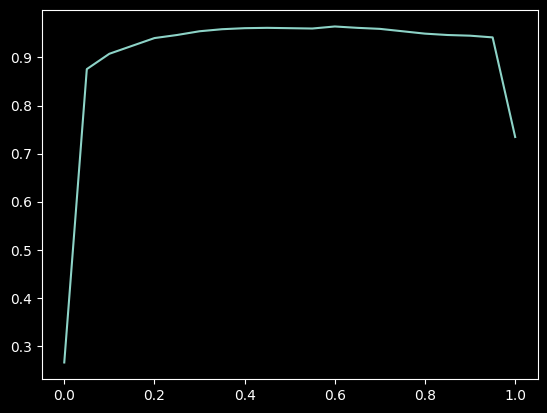

In [56]:
thresholds = np.linspace(0,1,21)

scores = []
for t in thresholds:
    churn_dec = (y_pred >= t)
    score = (y_val == churn_dec). mean()
    scores.append(score) 

print(dict(zip(thresholds, scores)))

# Plot the thresholds vs. scores
plt.plot(thresholds, scores)

The best accuracy `(0.9645)` was achieved at threshold of `0.6`.

**The dummy model**

You may notice that at 0 threshold the accuracy is 26.5% while at 1 the accuracy is 73.5%.

In [57]:
from collections import Counter
Counter(y_pred >= 1.0)

Counter({False: 1409})

What this is saying is that at threshold of 1.0, There are actually no values which are >= 1.0. If we are to compare `y_val == churn_decision`, (churn_decision = y_pred>= 1.0) it will be `True` for all values of y_val which are 0, because all the values of our `churn_decision` are 0's. This will be true **73.5%** of the time, which is also the distribution of 0's in our validation dataset. That's why we got this kind of accuracy.

This is called the `DUMMY MODEL`. On its own, it seems like a pretty decent model because of its good accuracy. But does accuracy really tell us the truth in this situation?

The problem with `acccuracy` is that it is misleading when applied to **IMBALANCED** dataset. You just based your predictions on what is the larger class. It cannot correctly evaluate a model which is trained in this kind of dataset.

**B. Confusion table**

* Different types of errors and correct decisions
* Arranging them in a table

In [58]:
actual_positive = (y_val == 1)
actual_negative = (y_val == 0)

In [59]:
t = 0.5
predict_positive = (y_pred >= t)
predict_negative = (y_pred < t)

In [60]:
tp = (predict_positive & actual_positive).sum()
tn = (predict_negative & actual_negative).sum()

fp = (predict_positive & actual_negative).sum()
fn = (predict_negative & actual_positive).sum()

In [61]:
confusion_matrix = np.array([
    [tn, fp],
    [fn, tp]
])
confusion_matrix

array([[1012,   23],
       [  32,  342]])

In [62]:
confusion_box = (confusion_matrix / confusion_matrix.sum()).round(2)
confusion_box

array([[0.72, 0.02],
       [0.02, 0.24]])

In [63]:
df_confusion = pd.DataFrame(confusion_box,columns=['True Negative','True Positive'], index=['Predicted Negative','Predicted Positive'])
df_confusion

,True Negative,True Positive
Predicted Negative,0.72,0.02
Predicted Positive,0.02,0.24


Accuracy = 0.72 + 0.24 = 0.96.

**C. Precision, Recall, Specificity, F1 Score**

1. Precision - or `positive predictive value` tells us how much of **positive predictions** are actually correct

In [64]:
precision = tp / (tp + fp)
precision

0.936986301369863

2. Recall - or `true positive rate` or `sensitivity`, tells us how much of **actual positives** are predicted correctly.

In [65]:
recall = tp / (tp + fn)
recall

0.9144385026737968

3. Specificity - or `true negative rate`, tells us how much of **actual negatives** are predicted correctly

In [66]:
specificity = tn / (tn + fp)
specificity

0.9777777777777777

4. F1-score - or `harmonic mean`, gives equal importance to both precision and recall.

The general formula for f1-score, is where a positive real $\beta$ is chosen, such that recall is considered $\beta$ times as important as precision:

$$ F_{\beta} = (1 + \beta^{2}) \cdot \frac {precision\cdot recall} {(\beta^{2}\cdot precision) + recall} $$

Thus, making $\beta = 1$ means precision is **as important** as recall. Giving us the final formula:

$$ F_{1} = 2 \cdot \frac {precision\cdot recall} {precision + recall} $$

In [67]:
f1_score = 2*((precision * recall) / (precision + recall))
f1_score

0.9255751014884981

**D. ROC Curves**

Here, we are interested about the `recall`, which is the **True Positive Rate**, and `1 - specificity`, which is the **False Positive Rate**.

FPR is the fraction of false positives (FP) divided by the total number of negatives (FP and TN - the first row of confusion matrix), and we want to `minimize` it.

On the other hand, TPR or Recall is the fraction of true positives (TP) divided by the total number of positives (FN and TP - second row of confusion table), and we want to `maximize` this metric. 

ROC (Receiver Operating Characteristic) Curve tells us about how good the model can distinguish between two things (e.g If a customer will churn or not). Better models can accurately distinguish between the two. Whereas, a poor model will have difficulties in distinguishing between the two.

The area under the ROC curve is known as AUC. The more the AUC the better your model is. The farther away your ROC curve is from the middle line (which is the random model), the better your model is. This is how ROC-AUC can help us judge the performance of our classification models as well as provide us a means to select one model from many classification models.

In [68]:
round(recall,3)

0.914

In [69]:
false_positive_rate = fp / (fp + tn)
round(false_positive_rate, 3)

0.022

False Positive Rate is equal to `1 - specificity`, as shown below.

In [70]:
round(false_positive_rate, 3) == round(1 - specificity, 3)

True

In [71]:
def tpr_fpr_dataframe(y_val, y_pred):
    thresholds = np.linspace(0,1,101)

    scores = []
    for t in thresholds:
        actual_positive = (y_val == 1)
        actual_negative = (y_val == 0)
        predict_positive = (y_pred >= t)
        predict_negative = (y_pred < t)

        tp = (predict_positive & actual_positive).sum()
        tn = (predict_negative & actual_negative).sum()

        fp = (predict_positive & actual_negative).sum()
        fn = (predict_negative & actual_positive).sum()

        scores.append((t,tp,fp,fn,tn))

    columns = ['threshold','tp','fp','fn','tn']
    df_scores = pd.DataFrame(scores,columns=columns)

    df_scores['tpr'] = df_scores.tp /(df_scores.tp + df_scores.fn)
    df_scores['fpr'] = df_scores.fp/ (df_scores.fp + df_scores.tn)

    return df_scores

In [72]:
df_scores = tpr_fpr_dataframe(y_val, y_pred)
df_scores[::10]

,threshold,tp,fp,fn,tn,tpr,fpr
0,0.0,374,1035,0,0,1.000000,1.000000
10,0.1,367,123,7,912,0.981283,0.118841
20,0.2,365,75,9,960,0.975936,0.072464
30,0.3,358,48,16,987,0.957219,0.046377
40,0.4,353,34,21,1001,0.943850,0.032850
50,0.5,342,23,32,1012,0.914439,0.022222
60,0.6,333,9,41,1026,0.890374,0.008696
70,0.7,320,3,54,1032,0.855615,0.002899
80,0.8,303,0,71,1035,0.810160,0.000000
90,0.9,297,0,77,1035,0.794118,0.000000


Random Model

Let us simulate a random model which give predictions just like flipping a coin.

In [73]:
np.random.seed(2)
y_rand = np.random.uniform(0,1, size=len(y_val))

In [74]:
((y_rand >= 0.5) == y_val).mean()

0.5024840312278211

In [75]:
df_rand = tpr_fpr_dataframe(y_val, y_rand)
df_rand

,threshold,tp,fp,fn,tn,tpr,fpr
0,0.00,374,1035,0,0,1.000000,1.000000
1,0.01,372,1024,2,11,0.994652,0.989372
2,0.02,368,1012,6,23,0.983957,0.977778
3,0.03,367,1000,7,35,0.981283,0.966184
4,0.04,364,995,10,40,0.973262,0.961353
...,...,...,...,...,...,...,...
96,0.96,16,48,358,987,0.042781,0.046377
97,0.97,13,38,361,997,0.034759,0.036715
98,0.98,9,26,365,1009,0.024064,0.025121
99,0.99,4,10,370,1025,0.010695,0.009662


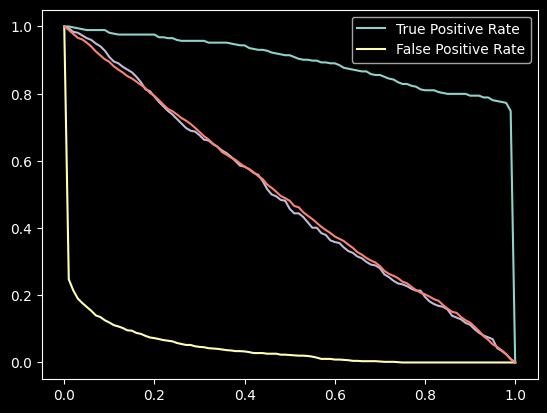

In [76]:
plt.plot(df_scores.threshold, df_scores['tpr'], label='True Positive Rate')
plt.plot(df_scores.threshold, df_scores['fpr'],label='False Positive Rate')


plt.plot(df_rand.threshold, df_rand['tpr'])
plt.plot(df_rand.threshold, df_rand['fpr'])
plt.legend()

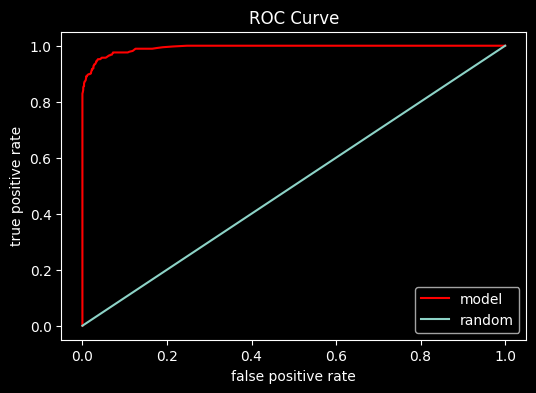

In [77]:
plt.figure(figsize=(6, 4))

plt.plot(df_scores.fpr, df_scores.tpr, color='red', label='model')
#plt.plot(df_rand.fpr, df_rand.tpr,color='yellow', label='random')
plt.plot([0,1],[0,1], label='random')
plt.legend()

plt.ylabel('true positive rate')
plt.xlabel('false positive rate')
plt.title('ROC Curve')

plt.show()

Using scikit-learn to draw the ROC Curve.

In [78]:
fpr,tpr, thresholds = roc_curve(y_val, y_pred)

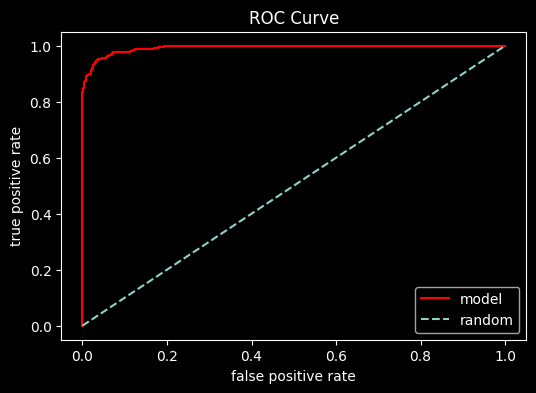

In [79]:
plt.figure(figsize=(6, 4))

plt.plot(fpr, tpr, color='red', label='model')
#plt.plot(df_rand.fpr, df_rand.tpr,color='yellow', label='random')
plt.plot([0,1],[0,1], label='random', linestyle='--')
plt.legend()

plt.ylabel('true positive rate')
plt.xlabel('false positive rate')
plt.title('ROC Curve')

plt.show()

**E. AUC Score**

* Area under the ROC curve
* interpretation of AUC

AUC tells us the probability that a randomly selected positive example has a higher score than a randomly selected negative example.

In [80]:
from sklearn.metrics import auc
auc(fpr,tpr)

0.9930817122632979

In [81]:
auc(df_scores.fpr, df_scores.tpr)

0.9930778371954843

In [82]:
from sklearn.metrics import roc_auc_score
roc_auc_score(y_val, y_pred)

0.9930817122632979

Implementing AUC Score in Python

In [83]:
neg = y_pred[y_val==0]
neg

array([1.08765448e-03, 1.78679210e-05, 6.33874174e-10, ...,
       1.29423601e-01, 3.75015379e-06, 3.92882478e-01])

In [84]:
y_pred

array([9.99994314e-01, 1.08765448e-03, 1.78679210e-05, ...,
       6.58350386e-01, 6.30557536e-01, 3.92882478e-01])

In [85]:
pos = y_pred[y_val == 1]
pos

array([0.99999431, 0.99784926, 0.99999427, 0.7800793 , 0.99999661,
       0.99999726, 0.99979538, 0.99999381, 0.20891463, 0.83696247,
       0.99999466, 0.96677244, 0.50979046, 0.67905551, 0.99999314,
       0.99999897, 0.99995272, 0.99999763, 0.31108418, 0.99998663,
       0.99993947, 0.99653121, 0.99999203, 0.99656584, 0.99969172,
       0.99993148, 0.99997949, 0.99998481, 0.99999571, 0.38270217,
       0.99996231, 0.99996884, 0.20434625, 0.99995315, 0.99627837,
       0.99999593, 0.99998178, 0.99999421, 0.99999155, 0.99883415,
       0.99545515, 0.99999314, 0.99712565, 0.99570155, 0.99999846,
       0.99998085, 0.78082259, 0.99999243, 0.99998255, 0.99916843,
       0.98430323, 0.40628883, 0.99998305, 0.99999235, 0.99993909,
       0.99837555, 0.99992042, 0.99999376, 0.70314547, 0.99999724,
       0.99930014, 0.99979556, 0.68587874, 0.99999538, 0.99999602,
       0.99998437, 0.99997188, 0.99882503, 0.92247289, 0.99906231,
       0.94444261, 0.99928632, 0.99892513, 0.998953  , 0.99999

In [86]:
y_val

array([1, 0, 0, ..., 1, 1, 0], dtype=int64)

In [87]:
len(y_val[y_val == 1])

374

In [88]:
len(y_pred[y_val == 1])

374

In [89]:
import random

In [90]:
n = 100000
success = 0
for i in range(n):
    pos_ind = random.randint(0, len(pos) - 1)
    neg_ind = random.randint(0, len(neg) - 1)

    if pos[pos_ind] > neg[neg_ind]:
        success += 1
success/n

0.99317

Implementing AUC score using numpy

In [91]:
n = 100000
np.random.seed(1)
pos_ind = np.random.randint(0,len(pos), size=n)
neg_ind = np.random.randint(0, len(neg), size=n)

((pos[pos_ind]) > (neg[neg_ind])).mean()

0.99312

In [92]:
churn_decision_test = y_pred_test >= 0.5
churn_decision_test.astype(int)

array([0, 1, 0, ..., 1, 0, 0])

In [93]:
cohen_kappa_val = cohen_kappa_score(y_val, churn_decision.astype(int))
cohen_kappa_val

0.8991253932736377

In [94]:
cohen_kappa = cohen_kappa_score(y_test, churn_decision_full_train)
cohen_kappa

0.896847538193237

In [95]:
from sklearn.metrics import average_precision_score

prc_val = average_precision_score(y_val,churn_decision.astype(int))
prc_val

0.8795274931048813

In [96]:
prc_test = average_precision_score(y_test,churn_decision_full_train)
prc_test

0.8783830930268746

##### **Cross-validation**

* Evaluating the same model on different subsets of data
* Getting the average prediction and the spread within predictions

In [100]:
def train(df_train, y_train):
    dicts = df_train[related_cats + numerical].to_dict(orient='records')
    dv = DictVectorizer(sparse=False)
    X_train = dv.fit_transform(dicts)

    model = LogisticRegression(max_iter=10000)
    model.fit(X_train, y_train)
    
    return dv, model 

In [101]:
dv, model = train(df_train, y_train)

In [102]:
def predict(df, dv, model):
    dicts = df[related_cats + numerical].to_dict(orient='records')
    
    X = dv.transform(dicts)
    y_pred = model.predict_proba(X)[:, 1] 

    return y_pred

In [103]:
y_pred = predict(df_val, dv, model)

In [ ]:
kfold = KFold(n_splits=10, shuffle=True, random_state=1)